# Исследование рынка заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве.

Цель исследования:
- определить оптимальный тип заведения: кафе, ресторан, пиццерия, паб или бар;
- найти оптимальное расположение заведения;
- определить ценовой диапазон для заведения.

Исследование будет проводиться на основе датасета с заведениями общественного питания Москвы, составленного на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, которая получена из сервиса Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках.

Оглавление  
1 Открываем файл и изучаем данные  
2 Предобработка данных  
2.1 Проверка наличия явных дубликатов  
2.2 Проверка наличия неявных дубликатов  
2.3 Проверка наличия пропусков  
2.3.1 Колонка `price`  
2.3.2 Колонка `avg_bill`  
2.3.3 Колонки `middle_avg_bill` и `middle_coffee_cup`
2.3.4 Колонка `seats`  
2.4 Добавление новых колонок  
2.4.1 Добавляем колонку `street`  
2.4.2 Добавляем колонку `is_24/7 `  
3 Анализ данных  
3.1 Количество объектов общественного питания по категориям  
3.2 Количество посадочных мест в заведениях по категориям  
3.3 Количество сетевых/несетевых заведений  
3.4 Частые категории сетевых заведений  
3.5 `ТОП-15` заведений  
3.6 Распределение категорий заведений по районам  
3.7 Распределение средних рейтингов по категориям заведений  
3.8 Распределение средних рейтингов по районам Москвы  
3.9 Распределение заведений на карте Москвы  
3.10 `ТОП-15` улиц по количеству заведений  
3.11 Улицы с количеством заведений равным `1`  
3.12 Влияние удаленности от центра на средний чек  
3.13 Взаимосвязь среднего чека, рейтинга и категории  
3.14 Результаты анализа  
4 Анализ данных о кофейнях в Москве  
4.1 Количество кофеен в Москве  
4.2 Районы кофеен в Москве  
4.3 Время работы кофеен  
4.4 Рейтинги кофеен  
4.5 Взаимосвязь среднего чека и рейтинга для кофеен  
4.6 Взаимосвязь среднего чека и количества посадочных мест для кофеен  
4.7 Цена чашки кофе и место расположения кофейни  
5 Вывод

## Импортируем библиотеки необходимые для работы с табличными данными и построения графиков и картограмм.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px

# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
# импортируем карту и хороплет
from folium import Map, Choropleth

## 1 Открываем файл и изучаем данные

#### Открываем файл moscow_places.csv

In [2]:
df = pd.read_csv('moscow_places.csv')

#### Смотрим на получившийся DataFrame

In [3]:
df.head()

,Unnamed: 0,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


#### Смотрим общую информацию о DataFrame используя метод info()

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         8406 non-null   int64  
 1   name               8406 non-null   object 
 2   category           8406 non-null   object 
 3   address            8406 non-null   object 
 4   district           8406 non-null   object 
 5   hours              7870 non-null   object 
 6   lat                8406 non-null   float64
 7   lng                8406 non-null   float64
 8   rating             8406 non-null   float64
 9   price              3315 non-null   object 
 10  avg_bill           3816 non-null   object 
 11  middle_avg_bill    3149 non-null   float64
 12  middle_coffee_cup  535 non-null    float64
 13  chain              8406 non-null   int64  
 14  seats              4795 non-null   float64
dtypes: float64(6), int64(2), object(7)
memory usage: 985.2+ KB


#### Смотрим на цифровые данные в DataFrame используя метод describe()

In [5]:
df.describe().round(2)

,Unnamed: 0,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.00,8406.00,8406.00,8406.00,3149.00,535.00,8406.00,4795.00
mean,4202.50,55.75,37.61,4.23,958.05,174.72,0.38,108.42
std,2426.75,0.07,0.10,0.47,1009.73,88.95,0.49,122.83
min,0.00,55.57,37.36,1.00,0.00,60.00,0.00,0.00
25%,2101.25,55.71,37.54,4.10,375.00,124.50,0.00,40.00
50%,4202.50,55.75,37.61,4.30,750.00,169.00,0.00,75.00
75%,6303.75,55.80,37.66,4.40,1250.00,225.00,1.00,140.00
max,8405.00,55.93,37.87,5.00,35000.00,1568.00,1.00,1288.00


#### Смотрим количество повторений уникальных значений

In [6]:
df['name'].value_counts()

Кафе                189
Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
                   ... 
Сащя                  1
Мой дом               1
Stardogs              1
Bar Park 15           1
Kebab Time            1
Name: name, Length: 5614, dtype: int64

In [7]:
df['name'].value_counts().head(30)

Кафе                                   189
Шоколадница                            120
Домино'с Пицца                          76
Додо Пицца                              74
One Price Coffee                        71
Яндекс Лавка                            69
Cofix                                   65
Prime                                   50
Хинкальная                              44
Шаурма                                  43
КОФЕПОРТ                                42
Кулинарная лавка братьев Караваевых     39
Теремок                                 38
Чайхана                                 37
Ресторан                                34
CofeFest                                32
Буханка                                 32
Столовая                                28
Му-Му                                   27
Drive Café                              24
Кофемания                               23
АндерСон                                22
French Bakery                           20
Cinnabon   

Описание данных в столбцах:
-	name — название заведения;
-	address — адрес заведения;
-	category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
-	hours — информация о днях и часах работы;
-	lat — широта географической точки, в которой находится заведение;
-	lng — долгота географической точки, в которой находится заведение;
-	rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
-	price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
-	avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: 
    -	«Средний счёт: 1000–1500 ₽»;
    -	«Цена чашки капучино: 130–220 ₽»;
    -	«Цена бокала пива: 400–600 ₽».
и так далее;
-	middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»: 
-	Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
-	Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
-	Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
-	middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»: 
-	Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
-	Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
-	Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
-	chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    -	0 — заведение не является сетевым
    -	1 — заведение является сетевым
-	district — административный район, в котором находится заведение, например Центральный административный округ;
-	seats — количество посадочных мест.


Мы получили DataFrame, который содержит 14 столбцов и 8406 строк.  
Уже сейчас мы видим, что
- в DataFrame есть пропущенные значения(столбцы `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats`);
- в столбце `hours` указаны данные о времени работы и тип данных определился как `object`, в дальнейшем данные из данных столбца может понадобиться такая информация как рабочие дни, время открытия, время закрытия;
- рейтинг заведений распределен от `1` до `5`;
- средний счет распределен от `0` до `35000`;
- средняя стоимость чашки кофе распределена от `60` до `1568`;
- больше половины заведений не являются сетевыми;
- количество посадочных мест распределено от `0` до `1288`.

Мы видим, что всего у нас есть 5614 уникальных названий, но в названиях заведений встречаются названия "Кафе"(189 раз),"Хинкальная"(44 раза), "Ресторан"(34 раза), которые характерны скорее для категорий, то есть под этим названиями могут скрываться совершенно разные заведения.

Итак, мы увидели что из 8406 строк мы имеем 5614 уникальных значения названий кафе в которых есть как сетевые кафе/рестораны (количество которых больше 1), так и назваяния под которомы записаны разные заведения "Кафе"(189 повторения),"Хинкальная"(44 повторения), "Ресторан"(34 повторения).  
Все колонки имеют тип подходящий под соедержимое.
В столбце `hour` данные имеют сложную структуру и требуется его предварительная обработка для детального анализа информации в нем.

## 2 Предобработка данных

In [8]:
df.head()

,Unnamed: 0,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Приведем основные характеристики заведения к нижнему регистру для поиска дубликатов

In [9]:
df['name']=df['name'].str.lower()
df['category']=df['category'].str.lower()
df['address']=df['address'].str.lower()

In [10]:
df.head()

,Unnamed: 0,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Приведение к ниижнему регистру выполнено успешно

### 2.1 Проверка наличия явных дубликатов

In [11]:
df[df.duplicated()]

,Unnamed: 0,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Явных дубликатов в данных нет

### 2.2 Проверка наличия неявных дубликатов

In [12]:
df[df[['name', 'category', 'address']].duplicated()]

,Unnamed: 0,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


Удаляем неявные дубликаты

In [13]:
df.drop(index=df[df[['name', 'category', 'address']].duplicated()].index)

,Unnamed: 0,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


Итак, два неявных дубликата удалены. Явных дубликатов в данных не найдено.

### 2.3 Проверка наличия пропусков

In [14]:
df.isna().mean()

Unnamed: 0           0.000000
name                 0.000000
category             0.000000
address              0.000000
district             0.000000
hours                0.063764
lat                  0.000000
lng                  0.000000
rating               0.000000
price                0.605639
avg_bill             0.546039
middle_avg_bill      0.625387
middle_coffee_cup    0.936355
chain                0.000000
seats                0.429574
dtype: float64

Мы видим, что наибольший процент пропусков приходится на столбцы `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` и `seats`  
Посмотрим на них подробнее.

#### 2.3.1 Колонка price

Строим сводную таблицу с группировкой по названиям, количеством заведений(`all_count`) и количеством пропуском в колонке `price`(`na_count`)

In [15]:
df_g = df.pivot_table(index='name', aggfunc={'name':'count', 'price':'count'})
df_g.columns=['all_count','not_na_count']
df_g = df_g.reset_index()
df_g['na_count']=df_g['all_count']-df_g['not_na_count']
df_g.query('all_count>4 and na_count>0 and not_na_count>0 and name not in ("Кафе", "Хинкальная", "Ресторан", "Пельменная")') \
    .sort_values(by='na_count', ascending=False).head(20)

,name,all_count,not_na_count,na_count
2825,кафе,189,5,184
1137,one price coffee,72,1,71
5418,шоколадница,120,52,68
2500,додо пицца,74,8,66
413,cofix,65,7,58
3178,кофепорт,42,1,41
5319,шаурма,43,3,40
2532,домино'с пицца,77,40,37
344,cofefest,32,3,29
2088,буханка,32,4,28


Итак, мы видим что пропуски наблюдаются в пределах одного заведения и мы можем заполнить пропуски в колонке `price` значениями из колонки `price` для того же заведения, так как цены в пределах региона в одном заведении должны быть одинаковыми.

#### 2.3.2 Колонка avg_bill

Строим сводную таблицу с группировкой по названиям(`name`), количеством заведений(`all_count`) и количеством пропуском(`na_count`) в колонке `avg_bill`

In [16]:
df_avg_bill_g = df.pivot_table(index='name', aggfunc={'name':'count', 'avg_bill':'count'})
df_avg_bill_g.columns=['not_na_count', 'all_count']
df_avg_bill_g = df_avg_bill_g.reset_index()
df_avg_bill_g['na_count']=df_avg_bill_g['all_count']-df_avg_bill_g['not_na_count']
df_avg_bill_g.sort_values(by='all_count', ascending=False) \
    .query('all_count>4 and na_count>0 and not_na_count>0 and name not in ("Кафе", "Хинкальная", "Ресторан", "Пельменная")') \
    .sort_values(by='na_count', ascending=False).head(20)

,name,not_na_count,all_count,na_count
2825,кафе,10,189,179
1137,one price coffee,6,72,66
5418,шоколадница,74,120,46
2532,домино'с пицца,35,77,42
5319,шаурма,3,43,40
413,cofix,35,65,30
2088,буханка,4,32,28
4993,хинкальная,19,44,25
344,cofefest,7,32,25
1263,prime,25,50,25


Итак, мы видим что пропуски наблюдаются в пределах одного заведения и мы можем заполнить пропуски в колонке `avg_bill` значениями из колонки `avg_bill` для того же заведения, так как цены в пределах региона в одном заведении должны быть одинаковыми.

#### 2.3.3 Колонки middle_avg_bill и middle_coffee_cup

Согласно условиям наличия значений в колонках `middle_avg_bill` и `middle_coffee_cup` пропуски могут возникать при отсутствии определенных значений в колонке `avg_bill`
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки `«Цена одной чашки капучино»`
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки `«Средний счёт»`: 

#### 2.3.4 Колонка seats

Пропуски в колонке seats могли возникнуть из-за отсутствия данных по заведениям. Заполнить их в колонке seats не возможно.

Итак:
В колонках price и avg_bill во всех кафе/ресторанах одной и той же сети можно заполнить одинаковыми значениями, так как цены в одной сети в одном городе не должны отличаться. Для заполнения пропусков требуется ручной анализ данных, так как в названиях заведений часто присуствуют одни и теже названия, например, "Кафе"(189 повторения),"Хинкальная"(44 повторения), "Ресторан"(34 повторения) и т.д., которые не позволяют провести заполнения пропусков.
В колонках middle_avg_bill и middle_coffee_cup пропуски возникают при отсутствии определенного текста в колонке avg_bill и является нормальным. Количество пропусков можно сократить, если заполнить пропуски в колонке avg_bill.
Пропуски в колонке seats могли возникнуть из-за отсутствия данных по заведениям. Заполнить их в колонке seats не возможно.

### 2.4 Добавление новых колонок

#### 2.4.1 Добавляем колонку `street`

In [17]:
#Создаем функцию для разделения строки по разделителю "," и берем второй элемент получившегося списка с индексом 1
def street_add(x):
    return x.split(',')[1]

In [18]:
df['street'] = df['address'].apply(street_add)

Проверяем что колонка добавлена успешно

In [19]:
df[['address', 'street']]

,address,street
0,"москва, улица дыбенко, 7/1",улица дыбенко
1,"москва, улица дыбенко, 36, корп. 1",улица дыбенко
2,"москва, клязьминская улица, 15",клязьминская улица
3,"москва, улица маршала федоренко, 12",улица маршала федоренко
4,"москва, правобережная улица, 1б",правобережная улица
...,...,...
8401,"москва, профсоюзная улица, 56",профсоюзная улица
8402,"москва, пролетарский проспект, 19, корп. 1",пролетарский проспект
8403,"москва, люблинская улица, 112а, стр. 1",люблинская улица
8404,"москва, люблинская улица, 112а, стр. 1",люблинская улица


Добавление колонки `street` выполнено успешно.

#### 2.4.2 Добавляем колонку `is_24/7 `

Смотрим на значения, которые встречаются наиболее часто

In [20]:
df['hours'].value_counts().head(20)

ежедневно, 10:00–22:00                                  759
ежедневно, круглосуточно                                730
ежедневно, 11:00–23:00                                  396
ежедневно, 10:00–23:00                                  310
ежедневно, 12:00–00:00                                  254
ежедневно, 09:00–21:00                                  204
ежедневно, 09:00–22:00                                  184
ежедневно, 12:00–23:00                                  178
ежедневно, 08:00–23:00                                  160
ежедневно, 08:00–22:00                                  148
ежедневно, 09:00–23:00                                  140
ежедневно, 11:00–00:00                                  127
ежедневно, 10:00–21:00                                  103
пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00     89
ежедневно, 10:00–00:00                                   79
ежедневно, 08:00–21:00                                   73
пн-пт 08:00–19:00                       

In [21]:
df['is_24/7'] = df['hours']=='ежедневно, круглосуточно'

Проверяем что колонка добавлена успешно

In [22]:
df[df['is_24/7']==True][['hours', 'is_24/7']].head(10)

,hours,is_24/7
10,"ежедневно, круглосуточно",True
17,"ежедневно, круглосуточно",True
19,"ежедневно, круглосуточно",True
24,"ежедневно, круглосуточно",True
49,"ежедневно, круглосуточно",True
50,"ежедневно, круглосуточно",True
54,"ежедневно, круглосуточно",True
61,"ежедневно, круглосуточно",True
70,"ежедневно, круглосуточно",True
84,"ежедневно, круглосуточно",True


In [23]:
df[df['is_24/7']==False][['hours', 'is_24/7']].head(10)

,hours,is_24/7
0,"ежедневно, 10:00–22:00",False
1,"ежедневно, 10:00–22:00",False
2,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",False
3,"ежедневно, 09:00–22:00",False
4,"ежедневно, 10:00–22:00",False
5,"ежедневно, 10:00–23:00",False
6,пн 15:00–04:00; вт-вс 15:00–05:00,False
7,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",False
8,"ежедневно, 10:00–22:00",False
9,"ежедневно, 12:00–00:00",False


## 3 Анализ данных

### 3.1 Количество объектов общественного питания по категориям

Строим сводную таблицу с распределением объектов общественного питания по категориям

In [24]:
cat_count = df['category'].value_counts().reset_index()
cat_count.columns = ['Категория', 'Количество']
cat_count['Доля']=round(cat_count['Количество']/cat_count['Количество'].sum(),2)
cat_count

,Категория,Количество,Доля
0,кафе,2378,0.28
1,ресторан,2043,0.24
2,кофейня,1413,0.17
3,"бар,паб",765,0.09
4,пиццерия,633,0.08
5,быстрое питание,603,0.07
6,столовая,315,0.04
7,булочная,256,0.03


Строим гистограмму с распределением объектов общественного питания по категориям

In [25]:
import plotly.express as px

fig = px.bar(cat_count, x='Категория', y='Количество', title='Количество заведений разных категорий')
fig.update_xaxes(tickangle=45)
fig.update_layout(
    title={
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    xaxis_tickangle=-45)
fig.show()

Итак, больше всего заведений имеют категории кафе, рестораны и кофейни. Бары, пабы, пиццерии, заведения быстрого питания, столовые и булочные встречаются намного реже.

### 3.2 Количество посадочных мест в заведениях по категориям

Смотрим на распределение посадочных мест на выбросы используя barplot. Это поможет нам понять какой график выбрать для сравнения посадочных мест по категориям

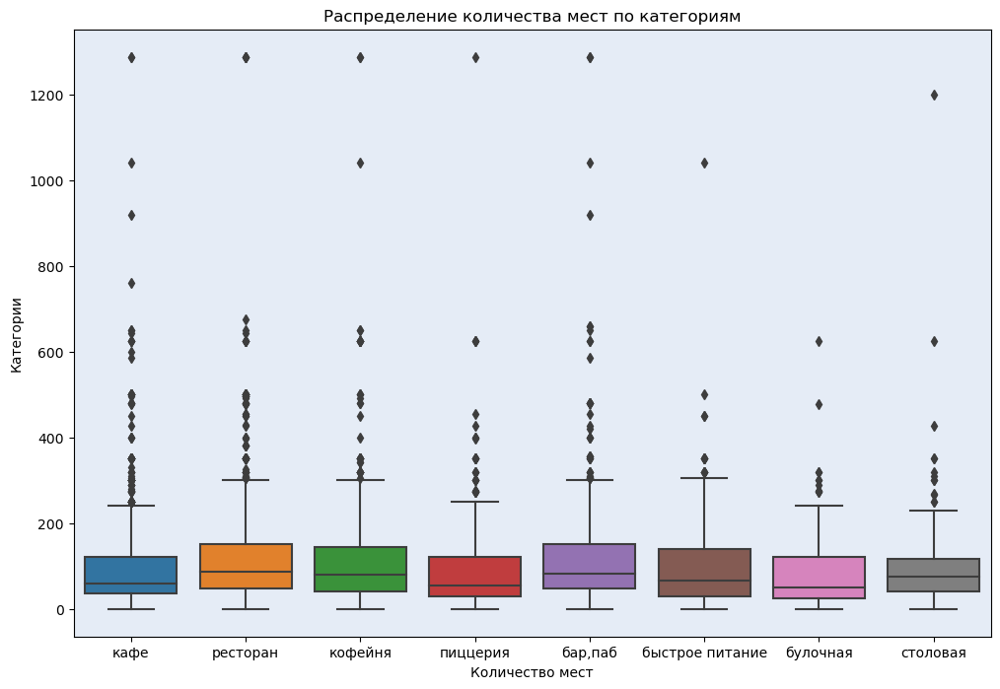

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12, 8))  # устанавливаем размер графика

sns.boxplot(x='category', y='seats', data=df, ax=ax)  # создаем график

# задаем цвет фона графика
ax.set_facecolor('#e5ecf6')
ax.set_title('Распределение количества мест по категориям')
ax.set_xlabel('Количество мест')
ax.set_ylabel('Категории')

plt.show()  # показываем график

Строим сводную таблицу с распределением посадочных мест в заведениях по категориям

In [27]:
cat_seat_g = df.pivot_table(index=['category'], values='seats', aggfunc=['mean','median']).reset_index()
cat_seat_g.columns = ['Категория', 'Среднее кол-во мест', 'Медиана кол-ва мест']
cat_seat_g['Среднее кол-во мест']=round(cat_seat_g['Среднее кол-во мест'],1)
cat_seat_g['Отклонение от среднего']=cat_seat_g['Среднее кол-во мест']-cat_seat_g['Медиана кол-ва мест']
cat_seat_g

,Категория,Среднее кол-во мест,Медиана кол-ва мест,Отклонение от среднего
0,"бар,паб",124.5,82.5,42.0
1,булочная,89.4,50.0,39.4
2,быстрое питание,98.9,65.0,33.9
3,кафе,97.5,60.0,37.5
4,кофейня,111.2,80.0,31.2
5,пиццерия,94.5,55.0,39.5
6,ресторан,121.9,86.0,35.9
7,столовая,99.8,75.5,24.3


Итак, по всем категориям наблюдаются выбросы(отклонение среднего от медианы есть везде), поэтому для сравнения будем использовать медианное значение.

Строим гистограмму с распределением медианного количества посадочных мест в заведениях по категориям

In [28]:
import plotly.express as px

fig = px.bar(cat_seat_g, x='Категория', y='Медиана кол-ва мест', title='Медианное количество посадочных мест по категориям заведений')
fig.update_xaxes(tickangle=45)
fig.update_layout(
    title={
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    xaxis={'categoryorder': 'total descending'},
    xaxis_tickangle=-45)
fig.show()

Наибольшее медианное количество посадочных мест находится в категории `ресторан`. Далее идут категории `бар,паб`, `кофейня`, а меньше всего в категории `булочные`.

Посмотрим на изменение количества мест в разрезе районов

In [29]:
cat_seat_g = df.pivot_table(index=['district'], values='seats', aggfunc=['mean','median']).reset_index()
cat_seat_g.columns = ['Район', 'Среднее кол-во мест', 'Медиана кол-ва мест']
cat_seat_g['Среднее кол-во мест']=round(cat_seat_g['Среднее кол-во мест'],0)
cat_seat_g

,Район,Среднее кол-во мест,Медиана кол-ва мест
0,Восточный административный округ,83.0,50.0
1,Западный административный округ,155.0,90.0
2,Северный административный округ,107.0,60.0
3,Северо-Восточный административный округ,99.0,70.0
4,Северо-Западный административный округ,96.0,85.0
5,Центральный административный округ,122.0,92.0
6,Юго-Восточный административный округ,82.0,55.5
7,Юго-Западный административный округ,85.0,70.0
8,Южный административный округ,110.0,75.0


Построим дополнительно разбивку посадочных мест по районам

In [30]:
fig = px.bar(cat_seat_g.sort_values(by='Медиана кол-ва мест', ascending=False), 
                x='Медиана кол-ва мест', 
                y='Район',
                title='Медиана количества посадочных мест по категориям заведений')
fig.update_xaxes(tickangle=45)
fig.update_layout(
    title={
    'y':0.95,
    'x':0.5,
    'xanchor': 'center',
    'yanchor': 'top'},
    yaxis={'categoryorder': 'total ascending'},
    xaxis_tickangle=-45)
fig.show()

В лидерах по медианному количеству мест `Центральный административный округ` и `Западный административный округ	`, а на последнем месте `Восточный административный округ`

Итак, лидерами по медианному количеству мест являются `Центральный административный округ` и `Западный административный округ`,
ТОП-3 категорий по медианному количество посадочных мест находится это `ресторан`, `бар,паб` и `кофейня`.

### 3.3 Количество сетевых/несетевых заведений

Строим сводную таблицу с распределением сетевых/несетевых заведений

In [31]:
chain_count = df['chain'].value_counts().reset_index()
chain_count.columns = ['Категория', 'Количество']
chain_count['Категория'] = chain_count['Категория'].replace(1, 'Сетевое заведение')
chain_count['Категория'] = chain_count['Категория'].replace(0, 'Несетевое заведение')
chain_count['Доля']=round(chain_count['Количество']/chain_count['Количество'].sum(),2)
chain_count

,Категория,Количество,Доля
0,Несетевое заведение,5201,0.62
1,Сетевое заведение,3205,0.38


Строим гистограмму с распределением сетевых/несетевых заведений

In [32]:
fig = px.bar(chain_count, x='Категория', y='Количество', title='Распределение сетевых/несетевых заведений')
fig.update_xaxes(tickangle=45)
fig.update_layout(
    title={
        #'text': 'Количество заведений разных типов',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    xaxis_tickangle=-45)
fig.show()

Доли несетевых заведений и сетевых заведений в общем числе заведений составляют 62% и 38% соответственно.

### 3.4 Частые категории сетевых заведений

Строим сводную таблицу с распределением доли сетевых заведений по категориям

In [33]:
df_chain1 = df.query('chain==1').pivot_table(index=['category'], values='name', aggfunc='count')
df_chain1.columns = ['Количество сетевых']

df_chain0 = df.query('chain==0').pivot_table(index=['category'], values='name', aggfunc='count')
df_chain0.columns = ['Количество несетевых']

df_chain = pd.concat([df_chain1,df_chain0])

df_merged = df_chain1.join(df_chain0, on='category')
df_merged['Всего']=(df_merged['Количество сетевых']+df_merged['Количество несетевых'])
df_merged['Доля сетевых']=round(df_merged['Количество сетевых']/df_merged['Всего'],2)
df_merged=df_merged.sort_values(by='Доля сетевых', ascending=False).reset_index()
df_merged.columns = ['Категория','Количество сетевых','Количество несетевых','Всего','Доля сетевых']
df_merged

,Категория,Количество сетевых,Количество несетевых,Всего,Доля сетевых
0,булочная,157,99,256,0.61
1,пиццерия,330,303,633,0.52
2,кофейня,720,693,1413,0.51
3,быстрое питание,232,371,603,0.38
4,ресторан,730,1313,2043,0.36
5,кафе,779,1599,2378,0.33
6,столовая,88,227,315,0.28
7,"бар,паб",169,596,765,0.22


Строим гистограмму с распределением доли сетевых заведений по категориям

In [34]:
fig = px.bar(df_merged, x='Категория', y='Доля сетевых', title='Доля сетевых заведений по категориям')
fig.update_xaxes(tickangle=45)
fig.update_layout(
    title={
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    xaxis_tickangle=-45)
fig.show()

Заведения в категории `булочная` чаще всего бывают сетевыми, а на втором месте по доле сетевых заведений идут категории `ресторан` и `кофейня`. Реже всего сетевые заведения можно встретить в категории `бар,паб`

### 3.5 ТОП-15 заведений

Строим сводную таблицу с ТОП-15 заведений

In [35]:
top15_name = df.query('chain==1')['name'].value_counts().reset_index().head(15)
top15_name.columns = ['Название', 'Количество']
top15_name=top15_name.sort_values(by='Количество', ascending=False)
top15_name['Доля']=round(top15_name['Количество']/top15_name['Количество'].sum(),2)
top15_name

,Название,Количество,Доля
0,шоколадница,120,0.15
1,домино'с пицца,76,0.09
2,додо пицца,74,0.09
3,one price coffee,71,0.09
4,яндекс лавка,69,0.08
5,cofix,65,0.08
6,prime,50,0.06
7,хинкальная,44,0.05
8,кофепорт,42,0.05
9,кулинарная лавка братьев караваевых,39,0.05


Безусловный лидер по количеству открытых сетевых заведений это кофейня `Шоколадница`

Строим график по ТОП-15 заведений

In [36]:
fig = px.bar(top15_name, x='Количество', y='Название', title='ТОП-15 заведений')
fig.update_xaxes(tickangle=45)
fig.update_layout(
    title={
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis={'categoryorder': 'total ascending'},
    xaxis_tickangle=-45)
fig.show()

`Шоколадница` - явный лидер.

Строим сводную таблицу по категориям ТОП-15 заведениий

In [37]:
top15_cat=df[df['name'].isin(list(top15_name['Название']))]['category'].value_counts().reset_index()
top15_cat.columns = ['Категория', 'Количество']
top15_cat=top15_cat.sort_values(by='Количество', ascending=False)
top15_cat['Доля']=round(top15_cat['Количество']/top15_cat['Количество'].sum(),2)
top15_cat

,Категория,Количество,Доля
0,кофейня,337,0.41
1,ресторан,186,0.23
2,пиццерия,152,0.19
3,кафе,100,0.12
4,булочная,25,0.03
5,быстрое питание,12,0.01
6,"бар,паб",4,0.00
7,столовая,2,0.00


In [38]:
fig = px.bar(top15_cat, x='Количество', y='Категория', title='Категории ТОП-15 заведений')
fig.update_xaxes(tickangle=45)
fig.update_layout(
    title={
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis={'categoryorder': 'total ascending'},
    xaxis_tickangle=-45)
fig.show()

Здесь лидируют `кофейни`

Строим сводную таблицу по районам ТОП-15 заведениий

In [39]:
top15_distict=df[df['name'].isin(list(top15_name['Название']))]['district'].value_counts().reset_index()
top15_distict.columns = ['Район', 'Количество']
top15_distict=top15_distict.sort_values(by='Количество', ascending=False)
top15_distict['Доля']=round(top15_distict['Количество']/top15_distict['Количество'].sum(),2)
top15_distict

,Район,Количество,Доля
0,Центральный административный округ,215,0.26
1,Южный административный округ,89,0.11
2,Северный административный округ,88,0.11
3,Западный административный округ,88,0.11
4,Северо-Восточный административный округ,85,0.10
5,Восточный административный округ,81,0.10
6,Юго-Западный административный округ,70,0.09
7,Юго-Восточный административный округ,56,0.07
8,Северо-Западный административный округ,46,0.06


`Центральный административный округ` в лидерах. Все отдыхают вместе, а потом разъезжаются по домам.

Строим сводную таблицу и тепловую карту по районам и категориям ТОП-15 заведениий

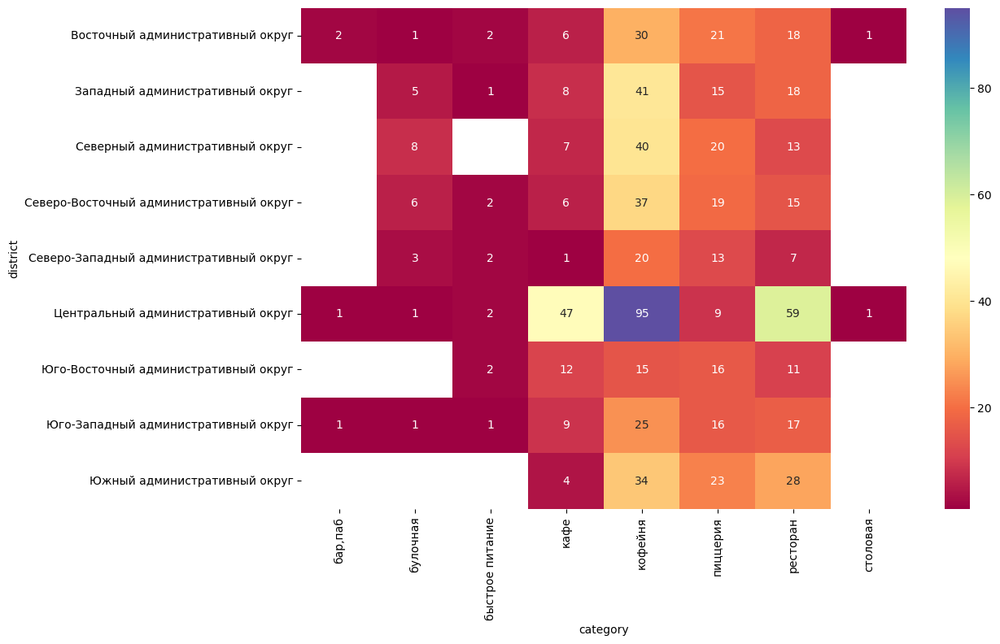

In [40]:
district_cat_top15g_2=df[df['name'].isin(list(top15_name['Название']))].pivot_table(index='district', columns='category',values='name',aggfunc='count') 
plt.figure(figsize = (12,8))
sns.heatmap(district_cat_top15g_2, cmap="Spectral", annot=True, fmt=".0f");

Среди ТОП-15 популярных сетей в Москве большая часть составляют `кофейни` в `Центральном административном округе`.  Далее, c большим отставанием, идут заведения в категории `рестораны` в том же `Центральном административном округе`.  
Лидером ко количеству открытых сетевых заведений является `Шоколадница`.  

### 3.6 Распределение категорий заведений по районам

Строим сводную таблицу с количеством заведений по районам

In [41]:
total = df.groupby('district').size().rename('Количество заведений') \
    .reset_index().sort_values(by='Количество заведений',ascending=False)

total.columns = ['Район', 'Количество заведений']
total

,Район,Количество заведений
5,Центральный административный округ,2242
2,Северный административный округ,900
8,Южный административный округ,892
3,Северо-Восточный административный округ,891
1,Западный административный округ,851
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


Строим сводную таблицу с количеством заведений по районам и категориям

In [42]:
district_cat_g=df.pivot_table(index=['district', 'category'], values='name', aggfunc='count').reset_index()
district_cat_g.columns = ['Район', 'Категория', 'Количество']
district_cat_g

,Район,Категория,Количество
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105
...,...,...,...
67,Южный административный округ,кафе,264
68,Южный административный округ,кофейня,131
69,Южный административный округ,пиццерия,73
70,Южный административный округ,ресторан,202


Посмотрим на распределение категорий по районам на диаграмме

In [43]:
fig = px.bar(district_cat_g, x="Количество", y="Район", color="Категория", title="Распределение количества заведений по категориям и районам")
fig.update_layout(
    title={
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis={'categoryorder': 'total ascending'},
    xaxis_tickangle=-45)
fig.show()

А теперь построим тепловую карту, чтобы посмотреть на лидеров

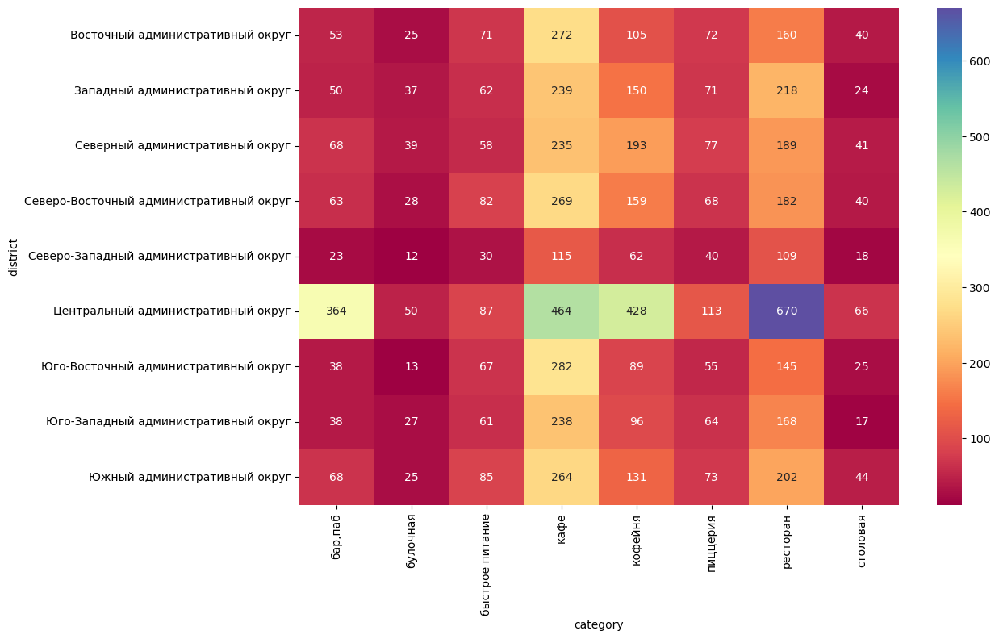

In [44]:
data_district=df.pivot_table(index='district', columns='category',values='name',aggfunc='count') 
plt.figure(figsize = (12,8))
sns.heatmap(data_district, cmap="Spectral", annot=True, fmt=".0f");

Среди всех заведений в Москве большая часть составляют рестораны расположенные в `Центральном административном округе`.  Далее идут заведения `кафе` и `кофейни` в том же Центральном административном округе.  
В `Центральном административном округе` расположено больше всего достопримечательностей и люди встречаются  после работы, поэтому он и лидирует по количеству заведений.

### 3.7 Распределение средних рейтингов по категориям заведений

Строим сводную таблицу  со средними рейтингами по категориям заведений

In [45]:
district_cat_g=df.pivot_table(index=['category'], values='rating', aggfunc='mean').reset_index()
district_cat_g.columns = ['Категория', 'Средний рейтинг']
district_cat_g['Средний рейтинг'] = district_cat_g['Средний рейтинг'].round(2)
district_cat_g

,Категория,Средний рейтинг
0,"бар,паб",4.39
1,булочная,4.27
2,быстрое питание,4.05
3,кафе,4.12
4,кофейня,4.28
5,пиццерия,4.30
6,ресторан,4.29
7,столовая,4.21


Построим диаграмму средних рейтингов по категориям заведений, чтобы визуально оценить разницу

In [46]:
fig = px.bar(district_cat_g, x="Средний рейтинг", y="Категория", title="средние рейтинги по категориям заведений")
fig.update_layout(
    title={
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis={'categoryorder': 'total ascending'},
    xaxis_tickangle=-45)
fig.show()

Средние рейтинги в разных категориях заведений отличаются не сильно. Первое место от последнего отличается на 0.33 балла.

### 3.8 Распределение средних рейтингов по районам Москвы

Строим сводную таблицу со средними рейтингами по районам

In [47]:
rating_g=df.pivot_table(index='district', values='rating', aggfunc=['mean']).reset_index()

rating_g.columns = ['Район', 'Средний рейтинг']
rating_g['Средний рейтинг'] = rating_g['Средний рейтинг'].round(2)
rating_g.sort_values(by='Средний рейтинг', ascending=False)

,Район,Средний рейтинг
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


Смотрим на распределение рейтингов на карте

In [48]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Задаем цветовые границы
color_scale = {'1-2': 'blue', '2-4': 'green', '>5': 'red'}

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_g,
    columns=['Район', 'Средний рейтинг'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг по районам',
).add_to(m)

# выводим карту
m

Наивысшие рейтинги наблюдаются в `Центральном административном округе`, а самые плохие в `Юго-Восточном административном округе`.

### 3.9 Распределение заведений на карте Москвы

Смотрм как распределены заведения на карте

In [49]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m


Больше всего заведений расположены в центре города

### 3.10 ТОП-15 улиц по количеству заведений

Строим сводную таблицу с ТОП-15 улиц по количеству заведений

In [50]:
top15_street = df['street'].value_counts().reset_index().head(15)
top15_street.columns = ['Улица', 'Количество']
top15_street=top15_street.sort_values(by='Количество', ascending=False)
top15_street['Доля']=round(top15_street['Количество']/top15_street['Количество'].sum(),2)
top15_street

,Улица,Количество,Доля
0,проспект мира,184,0.15
1,профсоюзная улица,122,0.10
2,проспект вернадского,108,0.09
3,ленинский проспект,107,0.09
4,ленинградский проспект,95,0.08
5,дмитровское шоссе,88,0.07
6,каширское шоссе,77,0.06
7,варшавское шоссе,76,0.06
8,ленинградское шоссе,70,0.06
9,мкад,65,0.05


Строим сводную таблицу по категориям ТОП-15 заведениий

In [51]:
top15_street_cat=df[df['street'].isin(top15_street['Улица'])][['street', 'category']].value_counts().reset_index()
top15_street_cat.columns = ['Улица','Категория', 'Количество']
top15_street_cat=top15_street_cat.sort_values(by='Количество', ascending=False)

top15_street_cat

,Улица,Категория,Количество
0,проспект мира,кафе,53
2,проспект мира,ресторан,45
1,мкад,кафе,45
3,проспект мира,кофейня,36
4,профсоюзная улица,кафе,35
...,...,...,...
106,люблинская улица,пиццерия,1
107,проспект вернадского,булочная,1
108,мкад,столовая,1
109,кутузовский проспект,булочная,1


Строим график по ТОП-15 заведений

In [52]:
import plotly.express as px

fig = px.bar(top15_street_cat, x="Количество", y="Улица", color="Категория", title="Распределение количества заведений по улицам и категориям")
fig.update_layout(
    title={
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis={'categoryorder': 'total ascending'},
    xaxis_tickangle=-45)
fig.show()

Строим тепловую карту распределения количества заведений по улицам и категориям

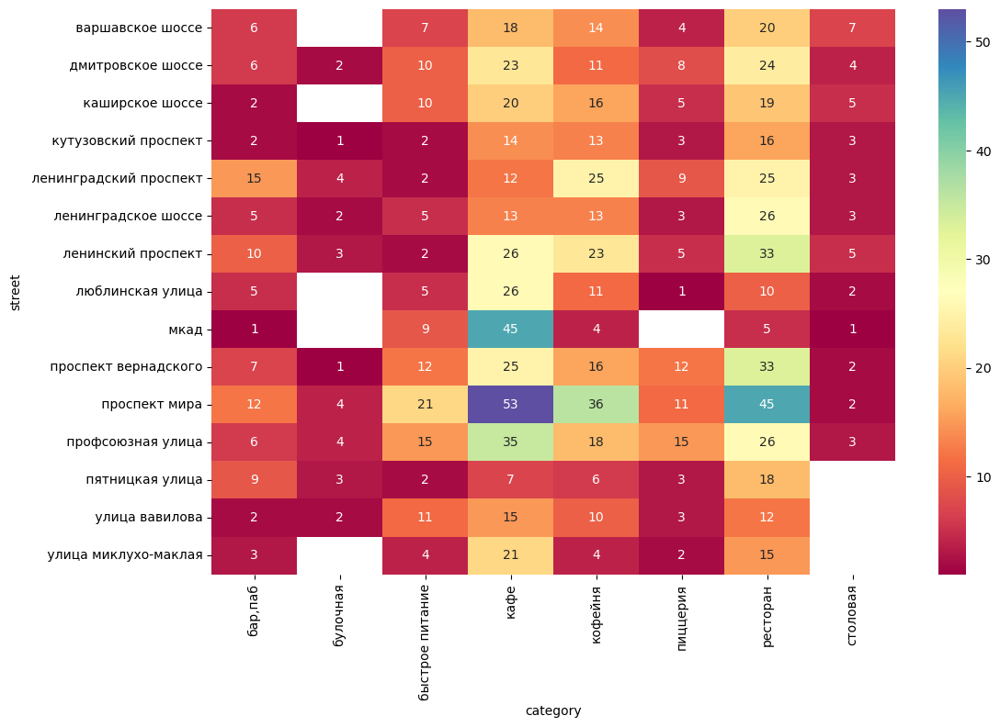

In [53]:
data_district=df[df['street'].isin(top15_street['Улица'])].pivot_table(index='street', columns='category',values='name',aggfunc='count') 
plt.figure(figsize = (12,8))
sns.heatmap(data_district, cmap="Spectral", annot=True, fmt=".0f");

Наибольшее количество заведений находится на проспекте Мира. Таке видим что много заведений в категрии кафе находится на МКАД, из-за его очень большой длины по сравнению с другими улицами.

### 3.11 Улицы с количеством заведений равным 1

Находим улицы, где располагается только одно заведение

In [54]:
street_place_cnt1 = df['street'].value_counts().reset_index().query('street==1')
street_place_cnt1.columns = ['Улица', 'Количество']
street_place_cnt1

,Улица,Количество
990,2-й рощинский проезд,1
991,улица стасовой,1
992,парк дружбы,1
993,улица губкина,1
994,улица ремизова,1
...,...,...
1442,малый казённый переулок,1
1443,улица маршала соколовского,1
1444,улица максимова,1
1445,басманный тупик,1


Смотрим на категории заведений

In [55]:
df[df['street'].isin(street_place_cnt1['Улица'])]['category'].value_counts()

кафе               159
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

Смотрим на район заведений

In [56]:
df[df['street'].isin(street_place_cnt1['Улица'])]['district'].value_counts()

Центральный административный округ         145
Северо-Восточный административный округ     55
Восточный административный округ            52
Северный административный округ             51
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district, dtype: int64

Итак, чаще всего заведения расположенные одни на улице расположены в `Центральном административном округе` и имеют категорию `кафе`. Но нельзя говорить о том что эти улицы не популярны. Малое количество заведений связано с длинной улиц.

### 3.12 Влияние удаленности от центра на средний чек

Строим сводную таблицу среднего чека по районам

In [57]:
district_median_bill=df.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False).reset_index()
district_median_bill.columns = ['Район', 'Медианный чек']
district_median_bill

,Район,Медианный чек
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


Строим картограмму среднего чека по районам.

In [58]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_median_bill,
    columns=['Район', 'Медианный чек'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек по районам',
).add_to(m)

# выводим карту
m


Проверим Западный административный округ. Нет ли какой-то локализации заведений

In [59]:
bmiddle_avg_bill_1000up=df.query('district=="Западный административный округ"') \
    .groupby('street')['middle_avg_bill'].median() \
    .sort_values(ascending=False) \
    .reset_index() \
    .query('middle_avg_bill > 1000')
bmiddle_avg_bill_1000up.head(10)

,street,middle_avg_bill
0,улица пудовкина,2750.0
1,университетский проспект,2750.0
2,улица крылатские холмы,2250.0
3,улица удальцова,2200.0
4,улица герасима курина,1750.0
5,украинский бульвар,1750.0
6,сколковское шоссе,1750.0
7,инициативная улица,1750.0
8,западный административный округ,1600.0
9,улица мичуринский проспект,1500.0


In [60]:
bmiddle_avg_bill_1000up_street=df[df['street'].isin(bmiddle_avg_bill_1000up['street'])]

Нанесем заведения `Западного административного округа` на карту 

In [61]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['street']} {row['middle_avg_bill']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
bmiddle_avg_bill_1000up_street.apply(create_clusters, axis=1)

# выводим карту
m

Картинка со средними ценами 1 кв.м. в Москве

http://forum.astrakhan.ru/uploads/monthly_2018_07/seminar4lrg.jpg.596e18552192416f5198b87bea0c1209.jpg

Мы видим, что при удалении от центра медианный чек снижается, исключение составляет только Западный административный округ. Стоит отметить, что средний чек в Западном административном округе совпадает с высокой средней ценой квадратного метра в Западном административном округе Москвы.

### 3.13 Взаимосвязь среднего чека, рейтинга и категории

Проверим связь среднего чека, рейтинга и категории с помощью scatter plot

In [62]:
# задаем параметры графика
fig = px.scatter(df, x='rating', y='middle_avg_bill', color='category',
                 color_discrete_sequence=px.colors.qualitative.Pastel, 
                 template='ggplot2')
fig.update_layout(
    yaxis_range=[0, 8000],
    plot_bgcolor="#e5ecf6",
    title='Зависимость среднего чека от рейтинга по категориям',
    xaxis_title='Рейтинг',
    yaxis_title='Средний чек'
)
# отображаем график на экране
fig.show()

In [63]:
# задаем параметры графика
fig = px.scatter(df, x='category', y='middle_avg_bill', color='category',
                 color_discrete_sequence=px.colors.qualitative.Pastel, 
                 template='ggplot2')
fig.update_layout(
    plot_bgcolor="#e5ecf6",
    yaxis_range=[0, 8000],
    title='Распределение средних чеков по категориям',
                   xaxis_title='Категория',
                   yaxis_title='Средний чек'
)
# отображаем график на экране
fig.show()

Строим тепловую карту для связи среднего чека, рейтинга и категории

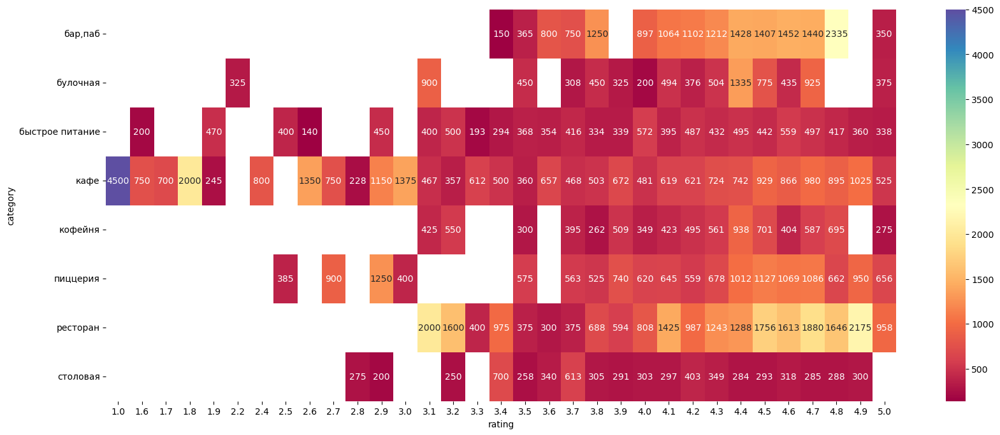

In [64]:
data_district=df.pivot_table(index='category', columns='rating',values='middle_avg_bill',aggfunc='mean') 
plt.figure(figsize = (20,8))
sns.heatmap(data_district, cmap="Spectral", annot=True, fmt=".0f");

По размеру среднего чека мы имеем:
- при снижении рейтинга заведений снижается средний чек;
- максимальные значения  среднего чека наблюдаются при рейтингах 4.2 - 4.7;
- наибольший средний чек приходится на категорию ресторан, на втором месте бар,паб

### 3.14 Результаты анализа

Проведя анализ данных мы выявили:

- больше всего заведений имеют категории `кафе`, `рестораны` и `кофейни`. `Бары, пабы`, `пиццерии`, `заведения быстрого питания`, `столовые` и `булочные` встречаются намного реже;

- наибольшее медианное количество посадочных мест находится в категории `ресторан`, далее идут категории `бар,паб`, `кофейня`, а меньше всего в категории `булочные`;

- доли несетевых заведений и сетевых заведений в общем числе заведений составляют 62% и 38% соответственно;

- заведения в категории `булочная` чаще всего бывают сетевыми, а на втором месте по доле сетевых заведений идут категории `ресторан` и `кофейня`. Реже всего сетевые заведения можно встретить в категории `бар,паб`;

- среди ТОП-15 популярных сетей в Москве большая часть составляют заведения в категории `кофейни` расположенные в `Центральном административном округе`, за ними идут заведения `рестораны` в том же Центральном административном округе,а лидером ко количеству открытых сетевых заведений является `Шоколадница`;

- cреди всех заведений в Москве большая часть составляют заведения в категории `рестораны` расположенные в Центральном административном округе, за ними расположились заведения `кафе` и `кофейни` в том же Центральном административном округе;

- cредние рейтинги в разных категориях заведений отличаются не сильно. Первое место от последнего отличается на `0.33` балла;

- наивысшие рейтинги наблюдаются в `Северо-Восточном административном округе`, а самые низкие в `Восточном административном округе`;

- больше всего заведений расположены в центре города как месту притяжения туристов и горожан;

- самая богатая заведениями улица это `проспект Мира`. Также видим что много заведений в категории `кафе` находится на `МКАД`, из-за его очень большой длины по сравнению с другими улицами;

- чаще всего заведения находящиеся одни на улице расположены в `Центральном административном округе` и имеют категорию `кафе`. Но нельзя говорить о том что эти улицы не популярны. Малое количество заведений связано с длиной улиц;

- при удалении от центра медианный чек снижается, исключение составляет только `Западный административный округ`, где размер среднего чека  коррелирует с высокой средней ценой квадратного метра по сравнению с другими районами;
- средний чек снижается при снижении рейтинга;
-  наибольший средний чек приходится на категорию `ресторан` и `бар, паб` с ретингом 4.2 - 4.7.

## 4 Анализ данных о кофейнях в Москве

### 4.1 Количество кофеен в Москве

Считаем количество кофеен

In [65]:
len(df.query('category=="кофейня"'))

1413

В Москве всего 1413 кофеен

### 4.2 Районы кофеен в Москве

Строим сводную таблицу  кофеен по районам

In [66]:
distr_c_count=df.query('category=="кофейня"').pivot_table(index='district', values='name', aggfunc='count')\
.sort_values(by='name', ascending=False).reset_index()
distr_c_count.columns = ['Район', 'Кол-во кофеен']
distr_c_count

,Район,Кол-во кофеен
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


Строим картограмму

In [67]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)


# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=distr_c_count,
    columns=['Район', 'Кол-во кофеен'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Кол-во кофеен по районам',
).add_to(m)

# выводим карту
m


Наибольшее количество кофеен расположено в Центральном административном округе. При удалении от центра города количество кофеен снижается. Похоже люди покупают кофе в начале рабочего дня.

### 4.3 Время работы кофеен

Смотрим на режим работы кофеен

In [68]:
coffee_time = df.query('category=="кофейня"')['hours'].value_counts().reset_index().head(20)
coffee_time.columns = ['Время работы','Количество']
coffee_time

,Время работы,Количество
0,"ежедневно, 10:00–22:00",140
1,"ежедневно, 08:00–22:00",60
2,"ежедневно, круглосуточно",59
3,"ежедневно, 09:00–22:00",57
4,пн-пт 08:00–19:00,46
5,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",46
6,"ежедневно, 09:00–21:00",43
7,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",42
8,"ежедневно, 08:00–21:00",36
9,пн-пт 08:00–18:30,34


Выводим на карту круглосуточные кофейни

In [69]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['street']} {row['middle_avg_bill']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.query('category=="кофейня" and hours=="ежедневно, круглосуточно"').apply(create_clusters, axis=1)

# выводим карту
m

В основном кофейни закрываются в 21-22 час, а открываются 8-10 утра, так как резко снижается количество посетителей. Также есть кофейни, которые расположены в офисных центрах и работают только по будним дням с 8 до 18-21 часов. Есть небольшое число кофеен(59 штук), которые работают круглосуточно, большая часть которых расположена в центре города.

### 4.4 Рейтинги кофеен

Строим сводную таблицу рейтинга и смотрим визуально на рейтинги

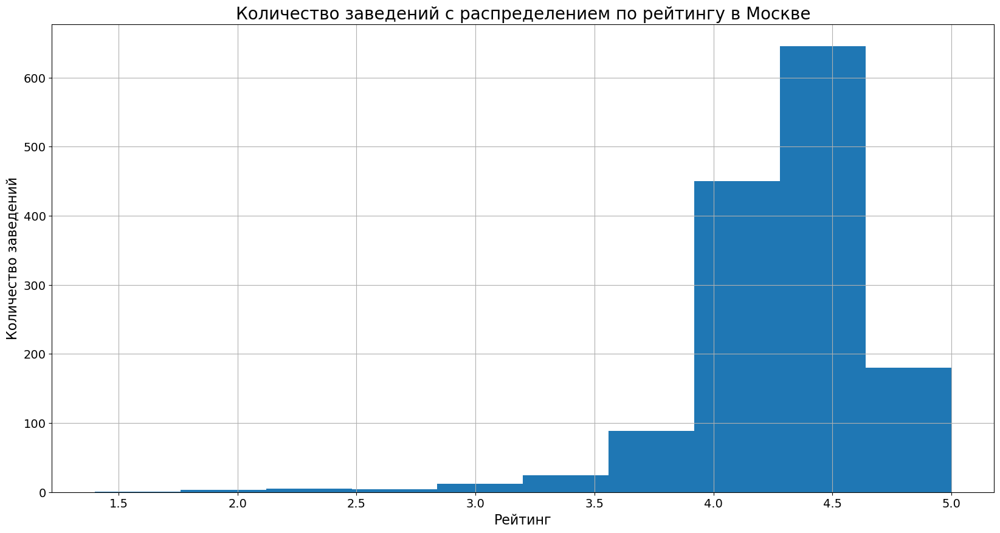

In [70]:
df.query('category=="кофейня"')['rating'].hist(figsize=(20,10))
# подписываем оси и задаем название
plt.xlabel('Рейтинг', fontsize=16)
plt.ylabel('Количество заведений', fontsize=16)
plt.title('Количество заведений с распределением по рейтингу в Москве', fontsize=20)

# устанавливаем размер шрифта меток на осях
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# отображаем график
plt.show()

In [71]:
rating_c_g=df.query('category=="кофейня"').pivot_table(index='district', values='rating', aggfunc=['mean']).reset_index()

rating_c_g.columns = ['_'.join(col).strip() for col in rating_c_g.columns.values]
rating_c_g.columns = ['Район', 'Средний рейтинг']
# Округляем значения до двух знаков
rating_c_g['Средний рейтинг'] = rating_c_g['Средний рейтинг'].round(2)
rating_c_g

,Район,Средний рейтинг
0,Восточный административный округ,4.28
1,Западный административный округ,4.20
2,Северный административный округ,4.29
3,Северо-Восточный административный округ,4.22
4,Северо-Западный административный округ,4.33
5,Центральный административный округ,4.34
6,Юго-Восточный административный округ,4.23
7,Юго-Западный административный округ,4.28
8,Южный административный округ,4.23


Строим картограмму с распределением средних цен по районам.

In [72]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Задаем цветовые границы
color_scale = {'1-2': 'blue', '2-4': 'green', '>5': 'red'}

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_g,
    columns=['Район', 'Средний рейтинг'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг по районам',
).add_to(m)

# выводим карту
m


Большая часть кофеен имеет рейтинг в 4.1-4.4

Мы видим, что все районы имеют примено одинаковые рейтинги. В Центральном, Северном и Северо-Западном рейтинги немного выше.

### 4.5 Взаимосвязь среднего чека и рейтинга для кофеен

Проверим связь среднего чека, рейтинга с помощью scatter plot

In [73]:
# задаем параметры графика
fig = px.scatter(df.query('category=="кофейня"'), x='rating', y='middle_avg_bill',
                 color_discrete_sequence=px.colors.qualitative.Pastel, 
                 template='ggplot2')
fig.update_layout(
    plot_bgcolor="#e5ecf6",
    title='Зависимость среднего чека от рейтинга по категориям',
    xaxis_title='Рейтинг',
    yaxis_title='Средний чек'
)
# отображаем график на экране
fig.show()

Для кофеен наблюдается зависимость среднего рейтинга от среднего чека, то есть при снижении рейтинга заведений снижается средний чек.

### 4.6 Взаимосвязь среднего чека и количества посадочных мест для кофеен

Проверим связь среднего чека и количества посадочных мест с помощью scatter plot

In [74]:
# задаем параметры графика
fig = px.scatter(df.query('category=="кофейня"'), x='seats', y='middle_avg_bill',
                 color_discrete_sequence=px.colors.qualitative.Pastel, 
                 template='ggplot2')
fig.update_layout(
    plot_bgcolor="#e5ecf6",
    title='Зависимость среднего чека от посадочных мест',
    xaxis_title='Количество мест',
    yaxis_title='Средний чек'
)
# отображаем график на экране
fig.show()

На рафике видно, что наибольший средний чек наблюдается с количеством мест около 100.

### 4.7 Цена чашки кофе и место расположения кофейни 

Смотрим на распределение цен на чашку кофе

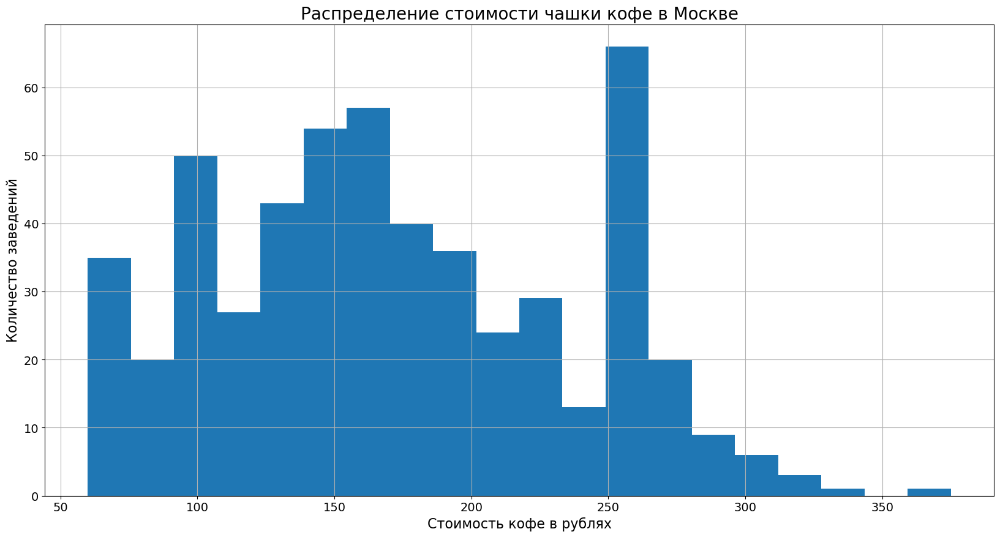

In [75]:
df.query('middle_coffee_cup<600')['middle_coffee_cup'].hist(bins=20, figsize=(20,10))
# подписываем оси и задаем название
plt.xlabel('Стоимость кофе в рублях', fontsize=16)
plt.ylabel('Количество заведений', fontsize=16)
plt.title('Распределение стоимости чашки кофе в Москве', fontsize=20)

# устанавливаем размер шрифта меток на осях
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# отображаем график
plt.show()

Есть смещение `вправо` и пик на цене в `250 рублей`

Строим сводную таблицу по средним ценам на чашку кофе

In [76]:
rating_cс_g=df.query('category=="кофейня"').pivot_table(index='district', values='middle_coffee_cup', aggfunc=['mean']).reset_index()
# Приводим к простым заголовкам
rating_cс_g.columns = ['Район', 'Средняя цена чашки кофе']
# Округляем значения до двух знаков
rating_cс_g['Средняя цена чашки кофе'] = rating_cс_g['Средняя цена чашки кофе'].round(2)
rating_cс_g

,Район,Средняя цена чашки кофе
0,Восточный административный округ,174.02
1,Западный административный округ,189.94
2,Северный административный округ,165.79
3,Северо-Восточный административный округ,165.33
4,Северо-Западный административный округ,165.52
5,Центральный административный округ,187.52
6,Юго-Восточный административный округ,151.09
7,Юго-Западный административный округ,184.18
8,Южный административный округ,158.49


Строим картограмму с распределением средних цен по районам.

In [77]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_cс_g,
    columns=['Район', 'Средняя цена чашки кофе'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек за чашку кофе по районам',
).add_to(m)

# выводим карту
m


Мы видим, что одним из районов с высоким ценником за чашку кофе является Западный административный округ. Так как в данном районе один из самых высоких средних чеков(по всем заведениям) сравнимый с центром города, то и имеет смыл открывать кофейню в данном районе.

Наносим на карту заведения с ценой чашки кофе от `200` до `600` рублей

In [78]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['street']} {row['middle_coffee_cup']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.query('600>middle_coffee_cup>200').apply(create_clusters, axis=1)

# выводим карту
m

### Результат

Итого, из проведенного исследования мы увидели
- в категории `кофейня` в Москве открыто 1413 заведений;
- больше всего кофеен открыто в Центральном административном округе;
- большая часть работает с 10 до 22, но есть и небольшое число круглосуточный кофеен;
- средние рейтинги сосредоточены в диапазоне 4.1-4.4, максимальные рейтинги в Центральном административном округе;
- максимальные средние цены на чашку кофе в Центральном административном и Западном административном округе.

## Вывод

Целью исследования было:
- определить оптимальный тип заведения: кафе, ресторан, пиццерия, паб или бар;
- найти оптимальное расположение заведения;
- определить ценовой диапазон для заведения.

В качестве открытия заведения общественного питания можно выбрать вариант открытия «кофейни», расположенной в Западном административном округе со временем работы «ежедневно 8-22» и ценой чашки кофе «250 рублей».

- `Кофейни` входят в ТОП-3 по количеству открытых заведений, что говорит о высокой конкуренции;
- `Кофейни` достаточно популярные заведения, среди ТОП-15 брендов категории «кофейня» больше всего, что говорит о высокой конкуренции поэтому рекомендовано открывать сетевые «кофейни» или работать по франшизе; 
- Конкуренция в категории `кофейни` выше чем у `бар,паб`, а средний чек ниже но за счет более раннего времени работы проходимость у `кофеен` будет больше;
- Западный административный округ по среднему чеку сравним с Центральным, а количество кофеен открыто намного меньше;
- При открытии «кофейни» в Западном административном округе можно ориентироваться на цену за чашку кофе в `250 рублей`, так как платежеспособность в данном районе выше из-за высокой цены 1 кв.м. жилья;
- Западном административном округе предпочтителен из-за не высокого среднего рейтинга заведений, что дает шанс привлечь больше посетителей при открытии рейтинговой кофейни;
- Наличие в Западном административном округе МГУ им. Ломоносова говорит о дополнительно потенциале;
- режим работы `«ежедневно, 8-22»` что позволит привлечь как утренних посетителей, так и тех кто хочет провести время после работы/учебы.

Ссылка на презентацию для заказчика по исследованию рынка заведений общественного питания в Москве

https://disk.yandex.ru/d/eaubvjCNB3lGEg